In [1]:
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

from pylab import rcParams

from utils import METRICS, CONT_PARAMETERS, LOG_PARAMETERS, SET_PARAMETERS, INT_PARAMETERS, read_narrow,\
    top_mean_dev_auc, top_mean_validation_auc, rolling_min_dev_auc

In [2]:
rcParams['figure.figsize'] = 20, 5
pd.set_option('display.max_columns', None)

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
files = ['./experiments/all-iterations-p36.pkl', 
          './experiments/not-narrow36.pkl', 
          './experiments/not-narrow236.pkl',
          './experiments/narrow-500-36.pkl',
          './experiments/narrow2-36.pkl']

In [5]:
best_mean_dev = top_mean_dev_auc(read_narrow(files), 50000)
best_mean_dev.groupby(['file', 'experiment_id']).ngroups

182

In [6]:
true_best = top_mean_validation_auc(read_narrow(files), 50000)
true_best.groupby(['file', 'experiment_id']).ngroups

206

window = 11 works a bit better than 5, 21, 51, but difference is not really meaningful

In [7]:
rolling_dev = rolling_min_dev_auc(read_narrow(files), 50000, 11)
rolling_dev.groupby(['file', 'experiment_id']).ngroups

183

In [8]:
# TODO compare by NDCG like ranked lists comparison

In [9]:
best_mean_dev[['mean_dev_auc', 'mean_validation_auc']].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,50000.0,0.823666,0.000992,0.822420,0.822799,0.823483,0.824375,0.828154
mean_validation_auc,50000.0,0.804060,0.001553,0.796459,0.803189,0.804216,0.805125,0.809782


In [10]:
true_best[['mean_dev_auc', 'mean_validation_auc']].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,50000.0,0.822260,0.002191,0.815924,0.821090,0.822549,0.823905,0.828154
mean_validation_auc,50000.0,0.805124,0.000825,0.804039,0.804525,0.804964,0.805468,0.809782


In [11]:
rolling_dev[['mean_dev_auc', 'rolling_min_dev_auc', 'mean_validation_auc']].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,50000.0,0.823647,0.001007,0.822283,0.822768,0.823471,0.824370,0.828154
rolling_min_dev_auc,50000.0,0.823514,0.000968,0.822283,0.822668,0.823305,0.824209,0.827747
mean_validation_auc,50000.0,0.804105,0.001504,0.796771,0.803215,0.804263,0.805129,0.809782


In [12]:
best_mean_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

129

In [13]:
best_mean_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(26836, 165)

In [14]:
rolling_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

132

In [15]:
rolling_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(27513, 166)

In [16]:
best = rolling_dev

In [17]:
best.shape

(50000, 85)

In [18]:
best.groupby(SET_PARAMETERS).mean_validation_auc.describe()

count      mean       std  \
param_is_unbalance param_boost_from_average                                
False              False                     11926.0  0.803856  0.001619   
                   True                        443.0  0.804572  0.002608   
True               False                     37631.0  0.804178  0.001437   

                                                  min       25%       50%  \
param_is_unbalance param_boost_from_average                                 
False              False                     0.796771  0.803063  0.804303   
                   True                      0.801126  0.803545  0.803545   
True               False                     0.797740  0.803215  0.804255   

                                                  75%       max  
param_is_unbalance param_boost_from_average                      
False              False                     0.804964  0.807811  
                   True                      0.805044  0.809782  
True               False                     0.805203  0.808569

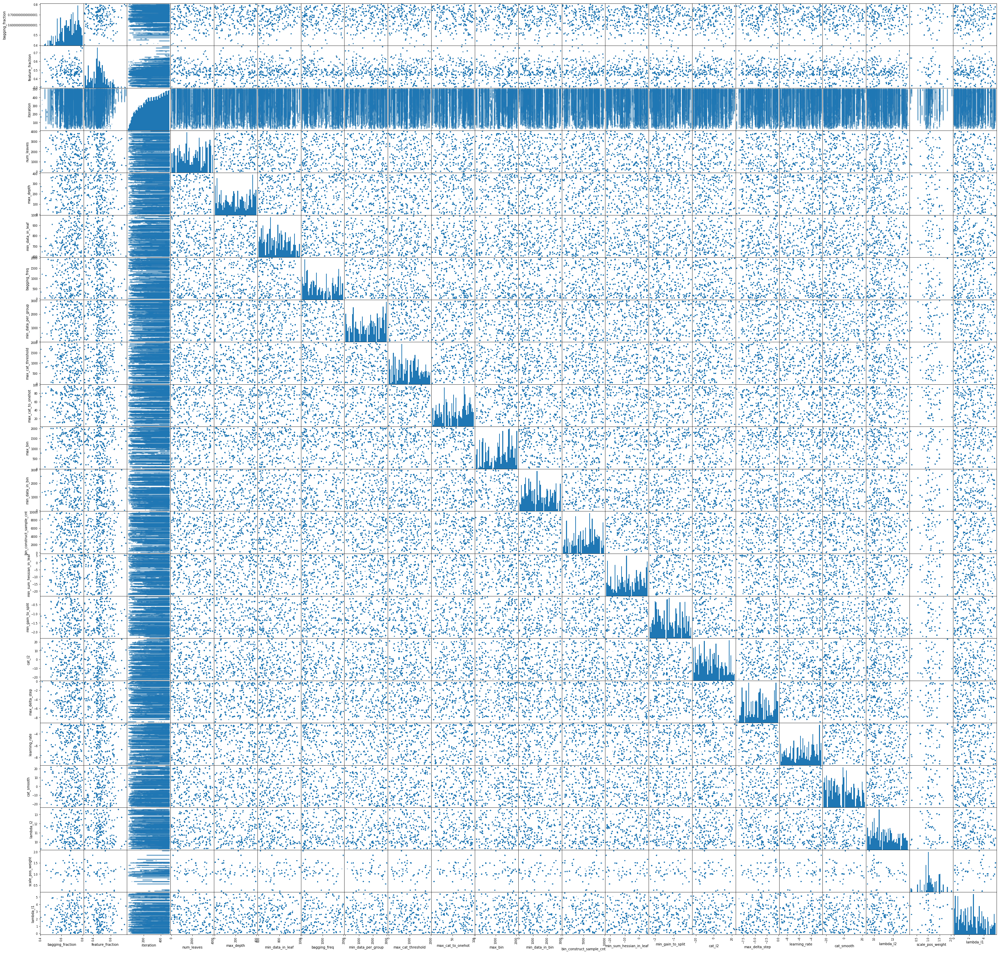

In [19]:
pd.plotting.scatter_matrix(
    pd.concat([best[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log(best[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns'),
    alpha=0.1, figsize=(50, 50), hist_kwds={'bins': 50});

### check failures in best selected parameter range

In [20]:
best_range = best\
    [[c for c in best.columns if c.startswith('param_') and not c in SET_PARAMETERS]]\
    .drop(columns=['param_seed'])\
    .quantile([0, 1]).T
best_range

,0.0,1.0
param_bagging_fraction,4.049493e-01,7.997832e-01
param_bagging_freq,4.000000e+00,1.983000e+03
param_bin_construct_sample_cnt,1.400000e+01,9.902000e+03
param_cat_l2,1.158263e-10,9.738108e+09
param_cat_smooth,1.097439e-10,8.993297e+09
param_feature_fraction,3.018585e-01,7.704591e-01
param_lambda_l1,1.007506e+00,2.492936e+02
param_lambda_l2,1.035307e+04,8.443256e+05
param_learning_rate,1.043082e-04,9.873221e-02
param_max_bin,4.000000e+01,2.042000e+03


In [21]:
dfs = []
for f in files:
    df = pd.read_pickle(f).assign(file=f)
    df = df[~df.param_boost_from_average.astype(bool)]
    for (n, l, h) in best_range.itertuples():
        df = df[(((df[n] >= l) & (df[n] <= h))
                 | df[n].isna())].copy()
    dfs.append(df)

limited = pd.concat(dfs, ignore_index=True, sort=True)
del dfs
limited.shape

(948000, 84)

In [22]:
limited_best_iteration = limited.sort_values('mean_dev_auc').groupby(['file', 'experiment_id']).last()
limited_best_iteration.shape

(1896, 82)

In [23]:
limited_best_iteration.mean_dev_auc.describe()

count    1896.000000
mean        0.708280
std         0.123901
min         0.500000
25%         0.623119
50%         0.755449
75%         0.815762
max         0.828154
Name: mean_dev_auc, dtype: float64

In [24]:
limited_bad = limited_best_iteration[limited_best_iteration.mean_dev_auc < 0.6]

In [25]:
limited_bad.shape

(459, 82)

TODO pikachu with bruises reaction

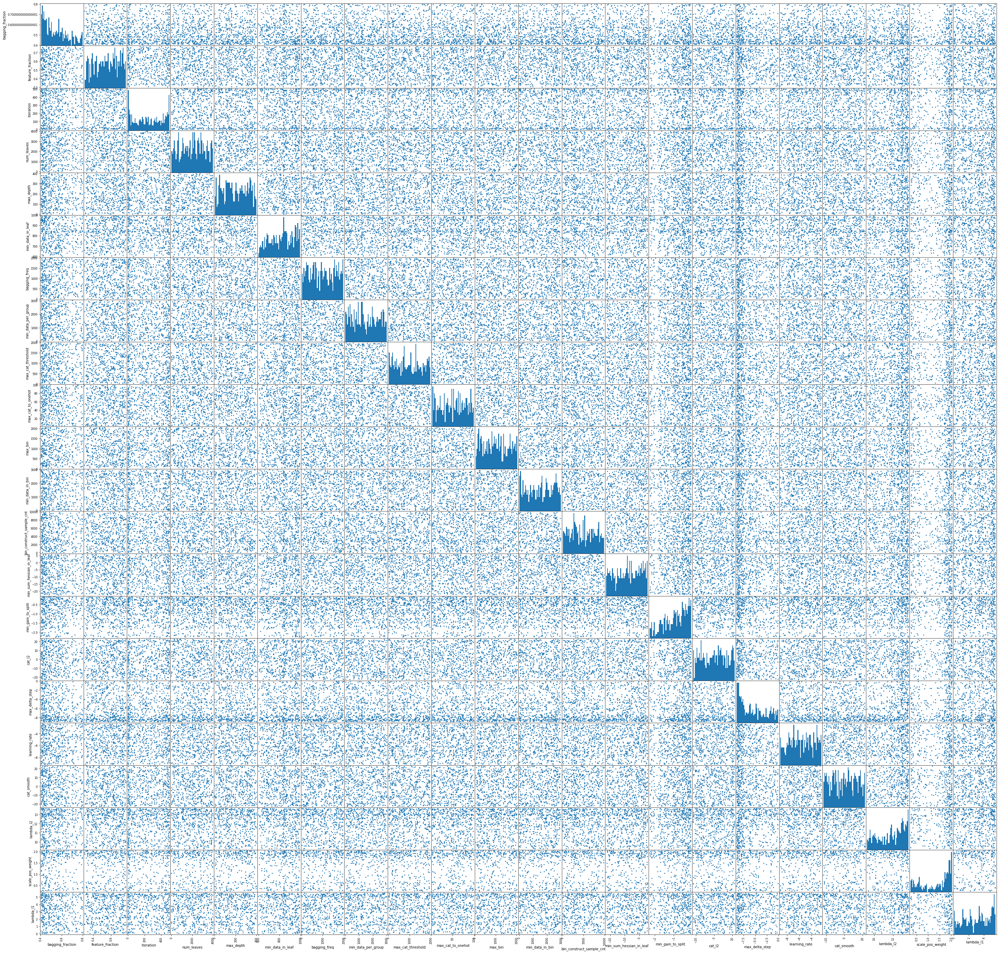

In [26]:
pd.plotting.scatter_matrix(
    pd.concat([limited_bad[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log(limited_bad[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns'),
    alpha=1, figsize=(50, 50), hist_kwds={'bins': 50});

### single best parameter set

In [27]:
single_best = rolling_dev.sort_values('rolling_min_dev_auc').iloc[-1]

In [28]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(single_best)

dev_train_diff_auc                                  0.000411526
dev_train_diff_binary_error                         -0.00115467
dev_train_diff_binary_logloss                       1.25669e-06
dev_train_diff_kldiv                                1.25669e-06
dev_train_diff_map_10                                -0.0310317
dev_train_diff_map_100                               -0.0513338
dev_train_diff_map_1000                                0.175454
experiment_id                                              4523
file                               ./experiments/narrow2-36.pkl
iteration                                                   144
mean_dev_auc                                            0.82791
mean_dev_binary_error                                  0.289669
mean_dev_binary_logloss                                0.690233
mean_dev_kldiv                                         0.690233
mean_dev_map_10                                        0.651984
mean_dev_map_100                        